# <center>Data Mining Project</center>

<center>
Master in Data Science and Advanced Analytics <br>
NOVA Information Management School
</center>

** **
## <center>*ABCDEats Inc*</center>

<center>
Group 19 <br>
Jan-Louis Schneider, 20240506  <br>
Marta Boavida, 20240519  <br>
Matilde Miguel, 20240549  <br>
Sofia Gomes, 20240848  <br>
</center>

** **

In [109]:
!jupyter nbconvert --to script "New_Features.ipynb"

[NbConvertApp] Converting notebook New_Features.ipynb to script
[NbConvertApp] Writing 15883 bytes to New_Features.py


In [110]:
import pandas as pd 
import numpy as np
import scipy

import matplotlib.pyplot as plt
import seaborn as sns

from scipy.stats import chi2_contingency
import scipy.stats as stats
import warnings

from math import ceil
from sklearn.impute import KNNImputer
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.preprocessing import OneHotEncoder, LabelEncoder
from sklearn.decomposition import PCA
from collections import Counter

import plotly.express as px

pd.set_option("display.max_columns", None)
pd.set_option("display.max_rows", None)

from New_Features import * 

In [111]:
df = pd.read_csv("../dataset/df_visualizations.csv")

In [112]:
df.head(5)

,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23,lifetime_days,preferred_order_days,preferred_part_of_day,total_expenses,avg_per_product,avg_per_order,avg_order_size,culinary_variety,chain_preference,loyalty_to_venders,customer_age_group
0,2360.0,18.0,2,5.0,1,0.0,1,DELIVERY,DIGI,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,28.88,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,1.0,"['DOW_6', 'DOW_0']",['18h-00h'],28.88,5.776,14.440,2.5,0.06667,0.5,1.0,18-22
1,8670.0,17.0,2,2.0,2,0.0,1,DISCOUNT,DIGI,12.82,6.39,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,1.0,"['DOW_6', 'DOW_0']",['06h-12h'],19.21,9.605,9.605,1.0,0.13333,1.0,1.0,15-17
2,4660.0,38.0,1,2.0,2,0.0,1,DISCOUNT,CASH,9.20,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1.0,"['DOW_6', 'DOW_0']",['06h-12h'],9.20,4.600,4.600,1.0,0.06667,1.0,0.5,36-49
3,4660.0,26.0,2,3.0,1,0.0,2,DELIVERY,DIGI,0.00,13.70,0.0,0.0,0.0,0.0,0.0,0.0,17.86,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,2.0,"['DOW_1', 'DOW_6']","['06h-12h', '12h-18h']",31.56,10.520,15.780,1.5,0.13333,0.5,1.0,23-28
4,4660.0,20.0,2,5.0,0,0.0,2,DELIVERY,DIGI,14.57,40.87,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,1,0.0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2.0,"['DOW_1', 'DOW_6']",['06h-12h'],55.44,11.088,27.720,2.5,0.13333,0.0,1.0,18-22


### <span style="color:yellow">COLOCAR CONCLUSÕES </span> 

## <span style="color:salmon">5. Feature Engineering </span> 


#### <span style="color:salmon"> 5.1 apagar alguns features, alterar outros (nao sei como chamar isso e se dever ser aqui ou em outra parte  </span> 

In [113]:
columns_to_drop = df.columns[9:55]  # dropping these columns since they are already included in features created in New_Features
columns_to_drop

Index(['CUI_American', 'CUI_Asian', 'CUI_Beverages', 'CUI_Cafe',
       'CUI_Chicken Dishes', 'CUI_Chinese', 'CUI_Desserts', 'CUI_Healthy',
       'CUI_Indian', 'CUI_Italian', 'CUI_Japanese', 'CUI_Noodle Dishes',
       'CUI_OTHER', 'CUI_Street Food / Snacks', 'CUI_Thai', 'DOW_0', 'DOW_1',
       'DOW_2', 'DOW_3', 'DOW_4', 'DOW_5', 'DOW_6', 'HR_0', 'HR_1', 'HR_2',
       'HR_3', 'HR_4', 'HR_5', 'HR_6', 'HR_7', 'HR_8', 'HR_9', 'HR_10',
       'HR_11', 'HR_12', 'HR_13', 'HR_14', 'HR_15', 'HR_16', 'HR_17', 'HR_18',
       'HR_19', 'HR_20', 'HR_21', 'HR_22', 'HR_23'],
      dtype='object')

In [114]:
df = df.drop(columns=columns_to_drop)

In [115]:
df.head()

,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,lifetime_days,preferred_order_days,preferred_part_of_day,total_expenses,avg_per_product,avg_per_order,avg_order_size,culinary_variety,chain_preference,loyalty_to_venders,customer_age_group
0,2360.0,18.0,2,5.0,1,0.0,1,DELIVERY,DIGI,1.0,"['DOW_6', 'DOW_0']",['18h-00h'],28.88,5.776,14.440,2.5,0.06667,0.5,1.0,18-22
1,8670.0,17.0,2,2.0,2,0.0,1,DISCOUNT,DIGI,1.0,"['DOW_6', 'DOW_0']",['06h-12h'],19.21,9.605,9.605,1.0,0.13333,1.0,1.0,15-17
2,4660.0,38.0,1,2.0,2,0.0,1,DISCOUNT,CASH,1.0,"['DOW_6', 'DOW_0']",['06h-12h'],9.20,4.600,4.600,1.0,0.06667,1.0,0.5,36-49
3,4660.0,26.0,2,3.0,1,0.0,2,DELIVERY,DIGI,2.0,"['DOW_1', 'DOW_6']","['06h-12h', '12h-18h']",31.56,10.520,15.780,1.5,0.13333,0.5,1.0,23-28
4,4660.0,20.0,2,5.0,0,0.0,2,DELIVERY,DIGI,2.0,"['DOW_1', 'DOW_6']",['06h-12h'],55.44,11.088,27.720,2.5,0.13333,0.0,1.0,18-22


In [117]:
df['customer_age_group'].unique()   # mapping age groups to values 1-6 to make the feature numerical. (Possible because it is a ratio scale variable)

array(['18-22', '15-17', '36-49', '23-28', '29-35', '50+'], dtype=object)

In [118]:
age_group_mapping = {
    '15-17': 1,
    '18-22': 2,
    '23-28': 3,
    '29-35': 4,
    '36-49': 5,
    '50+' : 6
}

In [119]:
df['customer_age_group'] = df['customer_age_group'].map(age_group_mapping)

In [120]:
df.head(5)

,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,lifetime_days,preferred_order_days,preferred_part_of_day,total_expenses,avg_per_product,avg_per_order,avg_order_size,culinary_variety,chain_preference,loyalty_to_venders,customer_age_group
0,2360.0,18.0,2,5.0,1,0.0,1,DELIVERY,DIGI,1.0,"['DOW_6', 'DOW_0']",['18h-00h'],28.88,5.776,14.440,2.5,0.06667,0.5,1.0,2
1,8670.0,17.0,2,2.0,2,0.0,1,DISCOUNT,DIGI,1.0,"['DOW_6', 'DOW_0']",['06h-12h'],19.21,9.605,9.605,1.0,0.13333,1.0,1.0,1
2,4660.0,38.0,1,2.0,2,0.0,1,DISCOUNT,CASH,1.0,"['DOW_6', 'DOW_0']",['06h-12h'],9.20,4.600,4.600,1.0,0.06667,1.0,0.5,5
3,4660.0,26.0,2,3.0,1,0.0,2,DELIVERY,DIGI,2.0,"['DOW_1', 'DOW_6']","['06h-12h', '12h-18h']",31.56,10.520,15.780,1.5,0.13333,0.5,1.0,3
4,4660.0,20.0,2,5.0,0,0.0,2,DELIVERY,DIGI,2.0,"['DOW_1', 'DOW_6']",['06h-12h'],55.44,11.088,27.720,2.5,0.13333,0.0,1.0,2


In [121]:
df = df.drop(columns=['customer_age'])   # now we can drop age because it is included in age group

In [122]:
# treat customer region as nonmetric because even tho it is numbers they dont have a natural order etc

In [123]:
nonmetric_columns = ['customer_region', 'last_promo', 'payment_method', 'preferred_order_days', 'preferred_part_of_day']

In [124]:
metric_columns = [col for col in df.columns if col not in nonmetric_columns]

In [125]:
metric_columns

['vendor_count',
 'product_count',
 'is_chain',
 'first_order',
 'last_order',
 'lifetime_days',
 'total_expenses',
 'avg_per_product',
 'avg_per_order',
 'avg_order_size',
 'culinary_variety',
 'chain_preference',
 'loyalty_to_venders',
 'customer_age_group']

#### <span style="color:salmon"> 5.1 Feature Encoding  </span> 

#### <span style="color:yellow"> O QUE FAZER COM AS COLUNAS QUE TEM LISTA? </span> 

In [126]:
#categorical_columns = df.columns.drop(numeric_columns)
columns_to_encode = ['last_promo', 'payment_method']

##### <span style="color:salmon"> 5.1.1 Frequency Encoding </span> 

Use the frequency of a category as its feature value.

In [127]:
df_freq_encoding = df.copy()

In [128]:
# Aplicar Frequency Encoding
for col in columns_to_encode:
    freq_encoding = df_freq_encoding[col].value_counts(normalize=True)  # Frequência relativa
    df_freq_encoding[col + '_freq_encoded'] = df_freq_encoding[col].map(freq_encoding)

# Exibir as primeiras linhas do DataFrame com as novas colunas codificadas
df_freq_encoding[[col + '_freq_encoded' for col in columns_to_encode]].head()

,last_promo_freq_encoded,payment_method_freq_encoded
0,0.721027,0.19215
1,0.141760,0.19215
2,0.141760,0.17768
3,0.721027,0.19215
4,0.721027,0.19215


##### <span style="color:salmon"> 5.1.1 One-hot encoding </span> 

Convert categorical variables into binary columns.

In [129]:
df_ohencoding = df.copy()

In [130]:

# Garantir que valores de lista sejam convertidos para strings uniformes
for col in columns_to_encode:
    df_ohencoding[col] = df_ohencoding[col].astype(str)

# Configurar e aplicar One-Hot Encoding
ohc = OneHotEncoder(sparse_output=False, drop='first')  # drop='first' para evitar colinearidade
ohc_encoded = ohc.fit_transform(df_ohencoding[columns_to_encode])

# Obter nomes das colunas após codificação
ohc_feat_names = ohc.get_feature_names_out(columns_to_encode)

# Criar DataFrame com colunas codificadas
ohc_df = pd.DataFrame(ohc_encoded, index=df_ohencoding.index, columns=ohc_feat_names)

# Concatenar os dados codificados ao DataFrame original (removendo as colunas categóricas originais)
df_ohencoding = pd.concat([df_ohencoding.drop(columns=columns_to_encode), ohc_df], axis=1)

# Exibir resultado
df_ohencoding.head()

,customer_region,vendor_count,product_count,is_chain,first_order,last_order,lifetime_days,preferred_order_days,preferred_part_of_day,total_expenses,avg_per_product,avg_per_order,avg_order_size,culinary_variety,chain_preference,loyalty_to_venders,customer_age_group,last_promo_DISCOUNT,last_promo_FREEBIE,payment_method_CASH,payment_method_DIGI
0,2360.0,2,5.0,1,0.0,1,1.0,"['DOW_6', 'DOW_0']",['18h-00h'],28.88,5.776,14.440,2.5,0.06667,0.5,1.0,2,0.0,0.0,0.0,1.0
1,8670.0,2,2.0,2,0.0,1,1.0,"['DOW_6', 'DOW_0']",['06h-12h'],19.21,9.605,9.605,1.0,0.13333,1.0,1.0,1,1.0,0.0,0.0,1.0
2,4660.0,1,2.0,2,0.0,1,1.0,"['DOW_6', 'DOW_0']",['06h-12h'],9.20,4.600,4.600,1.0,0.06667,1.0,0.5,5,1.0,0.0,1.0,0.0
3,4660.0,2,3.0,1,0.0,2,2.0,"['DOW_1', 'DOW_6']","['06h-12h', '12h-18h']",31.56,10.520,15.780,1.5,0.13333,0.5,1.0,3,0.0,0.0,0.0,1.0
4,4660.0,2,5.0,0,0.0,2,2.0,"['DOW_1', 'DOW_6']",['06h-12h'],55.44,11.088,27.720,2.5,0.13333,0.0,1.0,2,0.0,0.0,0.0,1.0


In [131]:
# the encoded features stay in the list non_metric_columns because they will not be used for clustering and scaling

In [132]:
df = df_ohencoding.copy()   # take one-hot-encoding in final dataset

#### <span style="color:salmon"> 5.2 Feature Transformation  </span> 


Feature tranformation is the process of modifying or transforming variables in a dataset to improve the performance of machine learning models, facilitate analysis, or meet the requirements of certain algorithms. 

This involves changing the scale, distribution or shape of variables.


##### <span style="color:salmon"> 5.2.1 Log Transformations </span> 

Goal: Handle skewed data by applying log

In [133]:
df_log = df.copy()

In [134]:
for col in metric_columns:
    df_log[col] = np.log1p(df_log[col])  # Direkte Überschreibung der Spalte mit den transformierten Werten

df_log.head()

,customer_region,vendor_count,product_count,is_chain,first_order,last_order,lifetime_days,preferred_order_days,preferred_part_of_day,total_expenses,avg_per_product,avg_per_order,avg_order_size,culinary_variety,chain_preference,loyalty_to_venders,customer_age_group,last_promo_DISCOUNT,last_promo_FREEBIE,payment_method_CASH,payment_method_DIGI
0,2360.0,1.098612,1.791759,0.693147,0.0,0.693147,0.693147,"['DOW_6', 'DOW_0']",['18h-00h'],3.397189,1.913387,2.736962,1.252763,0.064542,0.405465,0.693147,1.098612,0.0,0.0,0.0,1.0
1,8670.0,1.098612,1.098612,1.098612,0.0,0.693147,0.693147,"['DOW_6', 'DOW_0']",['06h-12h'],3.006178,2.361326,2.361326,0.693147,0.125160,0.693147,0.693147,0.693147,1.0,0.0,0.0,1.0
2,4660.0,0.693147,1.098612,1.098612,0.0,0.693147,0.693147,"['DOW_6', 'DOW_0']",['06h-12h'],2.322388,1.722767,1.722767,0.693147,0.064542,0.693147,0.405465,1.791759,1.0,0.0,1.0,0.0
3,4660.0,1.098612,1.386294,0.693147,0.0,1.098612,1.098612,"['DOW_1', 'DOW_6']","['06h-12h', '12h-18h']",3.483085,2.444085,2.820188,0.916291,0.125160,0.405465,0.693147,1.386294,0.0,0.0,0.0,1.0
4,4660.0,1.098612,1.791759,0.000000,0.0,1.098612,1.098612,"['DOW_1', 'DOW_6']",['06h-12h'],4.033178,2.492213,3.357594,1.252763,0.125160,0.000000,0.693147,1.098612,0.0,0.0,0.0,1.0


In [135]:
df_log.describe().round(2)

,customer_region,vendor_count,product_count,is_chain,first_order,last_order,lifetime_days,total_expenses,avg_per_product,avg_per_order,avg_order_size,culinary_variety,chain_preference,loyalty_to_venders,customer_age_group,last_promo_DISCOUNT,last_promo_FREEBIE,payment_method_CASH,payment_method_DIGI
count,31236.00,31236.00,31236.00,31236.00,31236.00,31236.00,31236.00,31236.00,31236.00,31236.00,31236.00,31236.00,31236.00,31236.00,31236.00,31236.00,31236.00,31236.00,31236.00
mean,5221.18,1.24,1.58,1.01,2.91,4.04,2.75,3.20,2.03,2.23,0.82,0.14,0.45,0.60,1.41,0.14,0.14,0.18,0.19
std,2612.95,0.50,0.66,0.70,1.16,0.62,1.68,0.90,0.49,0.61,0.15,0.08,0.26,0.13,0.24,0.35,0.34,0.38,0.39
min,2360.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.31,0.31,0.69,0.00,0.00,0.10,0.69,0.00,0.00,0.00,0.00
25%,2360.00,0.69,1.10,0.69,2.20,3.91,1.10,2.62,1.64,1.81,0.69,0.06,0.29,0.51,1.39,0.00,0.00,0.00,0.00
50%,4660.00,1.10,1.39,1.10,3.18,4.26,3.53,3.21,2.07,2.22,0.77,0.13,0.55,0.69,1.39,0.00,0.00,0.00,0.00
75%,8670.00,1.61,1.95,1.39,3.83,4.43,4.11,3.79,2.41,2.63,0.92,0.18,0.69,0.69,1.61,0.00,0.00,0.00,0.00
max,8670.00,3.33,4.01,3.56,4.51,4.51,4.51,5.80,3.13,4.26,1.61,0.51,0.69,0.69,1.95,1.00,1.00,1.00,1.00


In [136]:
df = df_log.copy()   # só se queremos usar a versao log. se nao nao fazer isso aqui!

##### <span style="color:salmon"> 5.2.2 Normalization </span> 

Goal: Rescale features to [0, 1]

In [137]:
df_minmax = df.copy()

For rescale the features, we use the method MinMaxScaler:

In [139]:
scaler_minmax = MinMaxScaler()
df_minmax[metric_columns] = scaler_minmax.fit_transform(df_minmax[metric_columns])
df_minmax.head()

,customer_region,vendor_count,product_count,is_chain,first_order,last_order,lifetime_days,preferred_order_days,preferred_part_of_day,total_expenses,avg_per_product,avg_per_order,avg_order_size,culinary_variety,chain_preference,loyalty_to_venders,customer_age_group,last_promo_DISCOUNT,last_promo_FREEBIE,payment_method_CASH,payment_method_DIGI
0,2360.0,0.329695,0.447120,0.194959,0.0,0.153662,0.153662,"['DOW_6', 'DOW_0']",['18h-00h'],0.585817,0.567435,0.614303,0.610740,0.126347,0.584963,1.000000,0.323657,0.0,0.0,0.0,1.0
1,8670.0,0.329695,0.274150,0.309003,0.0,0.153662,0.153662,"['DOW_6', 'DOW_0']",['06h-12h'],0.518390,0.726436,0.519034,0.000000,0.245015,1.000000,1.000000,0.000000,1.0,0.0,0.0,1.0
2,4660.0,0.208015,0.274150,0.309003,0.0,0.153662,0.153662,"['DOW_6', 'DOW_0']",['06h-12h'],0.400476,0.499772,0.357084,0.000000,0.126347,1.000000,0.518795,0.876951,1.0,0.0,1.0,0.0
3,4660.0,0.329695,0.345939,0.194959,0.0,0.243548,0.243548,"['DOW_1', 'DOW_6']","['06h-12h', '12h-18h']",0.600629,0.755812,0.635410,0.243529,0.245015,0.584963,1.000000,0.553295,0.0,0.0,0.0,1.0
4,4660.0,0.329695,0.447120,0.000000,0.0,0.243548,0.243548,"['DOW_1', 'DOW_6']",['06h-12h'],0.695488,0.772896,0.771707,0.610740,0.245015,0.000000,1.000000,0.323657,0.0,0.0,0.0,1.0


In [140]:
df_minmax[metric_columns].describe().round(3)

,vendor_count,product_count,is_chain,first_order,last_order,lifetime_days,total_expenses,avg_per_product,avg_per_order,avg_order_size,culinary_variety,chain_preference,loyalty_to_venders,customer_age_group
count,31236.000,31236.000,31236.000,31236.000,31236.000,31236.000,31236.000,31236.000,31236.000,31236.000,31236.000,31236.000,31236.000,31236.000
mean,0.373,0.393,0.285,0.645,0.896,0.609,0.552,0.610,0.486,0.135,0.265,0.656,0.852,0.573
std,0.149,0.164,0.198,0.257,0.138,0.373,0.155,0.173,0.153,0.168,0.153,0.381,0.221,0.190
min,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
25%,0.208,0.274,0.195,0.487,0.867,0.244,0.451,0.470,0.378,0.000,0.126,0.415,0.695,0.553
50%,0.330,0.346,0.309,0.705,0.945,0.782,0.554,0.624,0.483,0.087,0.245,0.786,1.000,0.553
75%,0.483,0.486,0.390,0.849,0.982,0.911,0.654,0.744,0.586,0.244,0.357,1.000,1.000,0.731
max,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000


In [141]:
# prefiro usar o standard scaler entao nao vamos usar o df do minmax scaler

##### <span style="color:salmon"> 5.2.3 Standardization </span> 

Goal: Scale features to have a mean of 0 and a standard deviation of 1

In [142]:
df_sd = df.copy()

In [143]:
scaler_standard = StandardScaler()
df_sd[metric_columns] = scaler_standard.fit_transform(df_sd[metric_columns])
df_sd.head()

,customer_region,vendor_count,product_count,is_chain,first_order,last_order,lifetime_days,preferred_order_days,preferred_part_of_day,total_expenses,avg_per_product,avg_per_order,avg_order_size,culinary_variety,chain_preference,loyalty_to_venders,customer_age_group,last_promo_DISCOUNT,last_promo_FREEBIE,payment_method_CASH,payment_method_DIGI
0,2360.0,-0.290087,0.327289,-0.455597,-2.510296,-5.371361,-1.221305,"['DOW_6', 'DOW_0']",['18h-00h'],0.219535,-0.247962,0.836736,2.839373,-0.910966,-0.186732,0.669419,-1.313846,0.0,0.0,0.0,1.0
1,8670.0,-0.290087,-0.725594,0.120615,-2.510296,-5.371361,-1.221305,"['DOW_6', 'DOW_0']",['06h-12h'],-0.216113,0.668754,0.216075,-0.802304,-0.132847,0.902339,0.669419,-3.018849,1.0,0.0,0.0,1.0
2,4660.0,-1.105536,-0.725594,0.120615,-2.510296,-5.371361,-1.221305,"['DOW_6', 'DOW_0']",['06h-12h'],-0.977961,-0.638071,-0.839011,-0.802304,-0.910966,0.902339,-1.505379,1.600876,1.0,0.0,1.0,0.0
3,4660.0,-0.290087,-0.288608,-0.455597,-2.510296,-4.720551,-0.980332,"['DOW_1', 'DOW_6']","['06h-12h', '12h-18h']",0.315236,0.838122,0.974250,0.649793,-0.132847,-0.186732,0.669419,-0.104127,0.0,0.0,0.0,1.0
4,4660.0,-0.290087,0.327289,-1.440639,-2.510296,-4.720551,-0.980332,"['DOW_1', 'DOW_6']",['06h-12h'],0.928126,0.936618,1.862202,2.839373,-0.132847,-1.721691,0.669419,-1.313846,0.0,0.0,0.0,1.0


In [144]:
df_sd[metric_columns].describe(include='all').round(2)

,vendor_count,product_count,is_chain,first_order,last_order,lifetime_days,total_expenses,avg_per_product,avg_per_order,avg_order_size,culinary_variety,chain_preference,loyalty_to_venders,customer_age_group
count,31236.00,31236.00,31236.00,31236.00,31236.00,31236.00,31236.00,31236.00,31236.00,31236.00,31236.00,31236.00,31236.00,31236.00
mean,0.00,0.00,0.00,0.00,0.00,0.00,-0.00,-0.00,-0.00,0.00,0.00,-0.00,-0.00,-0.00
std,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00
min,-2.50,-2.39,-1.44,-2.51,-6.48,-1.63,-3.57,-3.52,-3.17,-0.80,-1.74,-1.72,-3.85,-3.02
25%,-1.11,-0.73,-0.46,-0.61,-0.20,-0.98,-0.65,-0.81,-0.70,-0.80,-0.91,-0.63,-0.71,-0.10
50%,-0.29,-0.29,0.12,0.23,0.36,0.46,0.02,0.08,-0.02,-0.28,-0.13,0.34,0.67,-0.10
75%,0.74,0.56,0.53,0.79,0.63,0.81,0.66,0.77,0.65,0.65,0.60,0.90,0.67,0.83
max,4.20,3.69,3.61,1.38,0.76,1.05,2.90,2.25,3.35,5.16,4.82,0.90,0.67,2.25


In [145]:
df = df_sd.copy()

#### <span style="color:salmon"> 5.3 Dimensionality Reduction  </span> 

Reduce dimensionality while retaining variance.

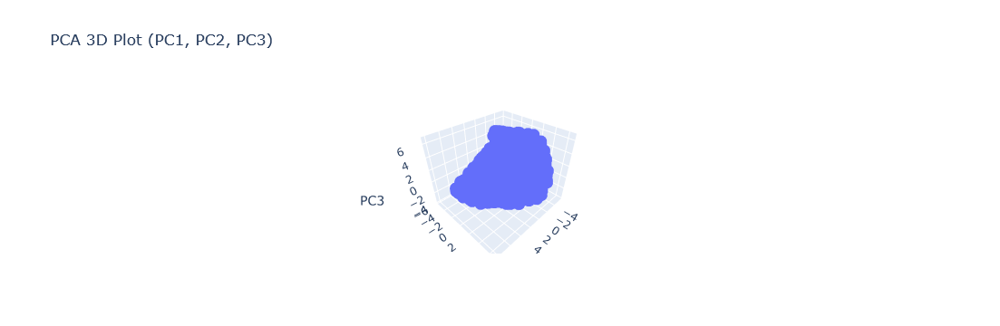

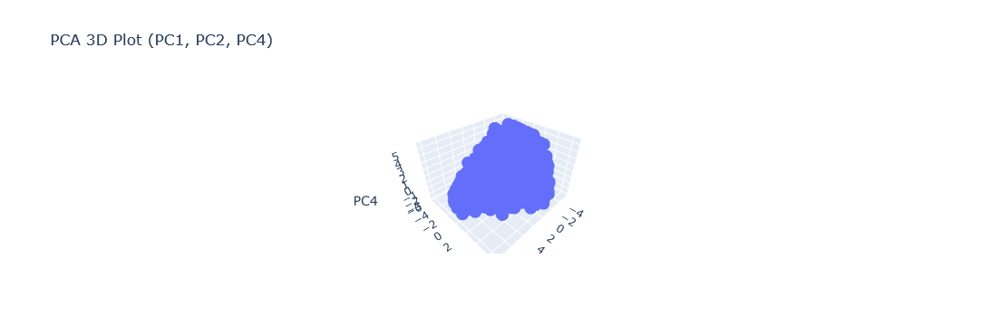

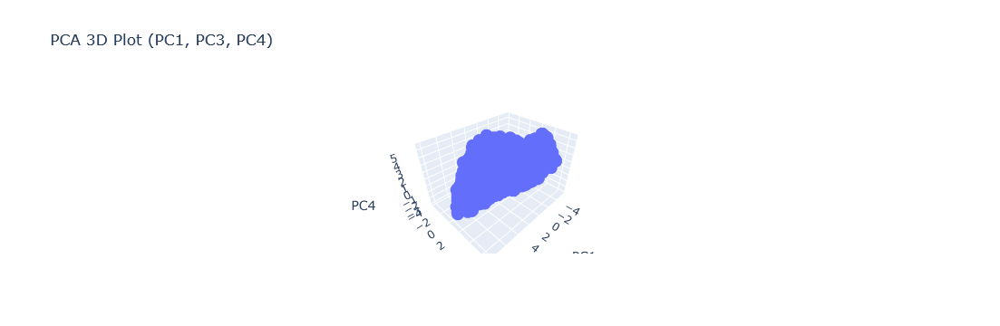

In [146]:
# Step 4: Apply PCA (with 4 components)
pca = PCA(n_components=4)  # Reduce to 4 principal components
principal_components = pca.fit_transform(df[metric_columns])

# Step 5: Create a DataFrame for the principal components
pca_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2', 'PC3', 'PC4'])

# Step 6: Create the interactive 3D PCA plot using Plotly for different combinations
fig1 = px.scatter_3d(pca_df, x='PC1', y='PC2', z='PC3', title="PCA 3D Plot (PC1, PC2, PC3)",
                     labels={'PC1': 'PC1', 'PC2': 'PC2', 'PC3': 'PC3'})

fig2 = px.scatter_3d(pca_df, x='PC1', y='PC2', z='PC4', title="PCA 3D Plot (PC1, PC2, PC4)",
                     labels={'PC1': 'PC1', 'PC2': 'PC2', 'PC4': 'PC4'})

fig3 = px.scatter_3d(pca_df, x='PC1', y='PC3', z='PC4', title="PCA 3D Plot (PC1, PC3, PC4)",
                     labels={'PC1': 'PC1', 'PC3': 'PC3', 'PC4': 'PC4'})

# Displaying plots
fig1.show()
fig2.show()
fig3.show()

In [147]:
# Store in df_visualizations the DataFrame of our dataset df
df_transform= pd.DataFrame(df)

# Save to CSV
df_transform.to_csv('../dataset/df_transform.csv', index=False)